In [2]:
# import packages
import pandas as pd
import sys
import networkx as nx 
import matplotlib.pyplot as plt

%matplotlib inline

print(f"Python version {sys.version}")
print(f"networkx version: {nx.__version__}")

# set datapath and separation parameter
datapath = "collaboration.csv"
sep_parameter = ';'

# read data as data
data = pd.read_csv(datapath, sep = sep_parameter)

data.head()

Python version 3.9.12 (main, Apr  5 2022, 01:53:17) 
[Clang 12.0.0 ]
networkx version: 2.7.1


,Venue,Author,Co-Authors,Title,Abstract
0,0,Hermann Gruber,"Markus Holzer, Christian Rauch",On 25 Years of CIAA Through the Lens of Data S...,We investigate the structure of the co-authors...
1,0,Markus Holzer,"Hermann Gruber, Christian Rauch",On 25 Years of CIAA Through the Lens of Data S...,We investigate the structure of the co-authors...
2,0,Christian Rauch,"Hermann Gruber, Markus Holzer",On 25 Years of CIAA Through the Lens of Data S...,We investigate the structure of the co-authors...
3,0,Nelma Moreira,Rogério Reis,Manipulation of Regular Expressions Using Deri...,The notions of derivative and partial derivati...
4,0,Rogério Reis,Nelma Moreira,Manipulation of Regular Expressions Using Deri...,The notions of derivative and partial derivati...


In [3]:
co_authors = data['Co-Authors'].tolist()
for i in range(len(co_authors)):
    co_authors[i] = str(co_authors[i]).split(', ')
authors = data['Author'].tolist()
for i in range(len(co_authors)):
    for j in range(len(co_authors[i])):
        co_authors[i][j] = co_authors[i][j].replace('nan', '')
co_authors

[['Markus Holzer', 'Christian Rauch'],
 ['Hermann Gruber', 'Christian Rauch'],
 ['Hermann Gruber', 'Markus Holzer'],
 ['Rogério Reis'],
 ['Nelma Moreira'],
 ['Hyunjoon Cheon', 'Yo-Sub Han'],
 ['Sicheol Sung', 'Yo-Sub Han'],
 ['Sicheol Sung', 'Hyunjoon Cheon'],
 ['Martin Berglund'],
 ['Brink van der Merwe'],
 ['Lydia Rodriguez de la Nava'],
 ['Florent Jacquemard'],
 ['Maurice Herwig', 'Martin Lange'],
 ['Florian Bruse', 'Martin Lange'],
 ['Florian Bruse', 'Maurice Herwig'],
 ['Richard Mörbitz', 'Heiko Vogler'],
 ['Frank Drewes', 'Heiko Vogler'],
 ['Frank Drewes', 'Richard Mörbitz'],
 [''],
 ['Robert Mercaş', 'Daniel Reidenbach'],
 ['Laura K. Hutchinson', 'Daniel Reidenbach'],
 ['Laura K. Hutchinson', 'Robert Mercaş'],
 ['Uwe Meyer'],
 ['Martin Kutrib'],
 ['Andreas Malcher', 'Matthias Wendlandt'],
 ['Martin Kutrib', 'Matthias Wendlandt'],
 ['Martin Kutrib', 'Andreas Malcher'],
 ['Viktor Olejár'],
 ['Michal Hospodár'],
 [''],
 ['Alexander Okhotin'],
 ['Olga Martynova'],
 ['Kai Salomaa'],


In [4]:
#Initiate network-graph
G = nx.Graph()
#G.add_nodes_from(authors)
for i in range(len(authors)):
    for j in range(len(co_authors[i])):
        G.add_edge(authors[i], co_authors[i][j])



In [6]:
# larger figure size
plt.figure(3,figsize=(20,20)) 
nx.draw_spring(G, node_size=60, font_size=8, with_labels = True)
print(G.number_of_nodes())
plt.show()


AttributeError: module 'scipy.sparse' has no attribute 'coo_array'

<Figure size 1440x1440 with 0 Axes>

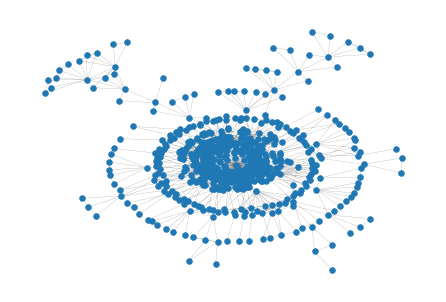

In [7]:
nx.draw_kamada_kawai(G, node_size = 30, width = 0.1)

In [78]:
co_authors.count('nan')

0

In [79]:
#try something with weight (does not work like i want it to)
author_weight = []
for i in range(len(authors)):
    author_weight.append(int(authors.count(authors[i])))

625


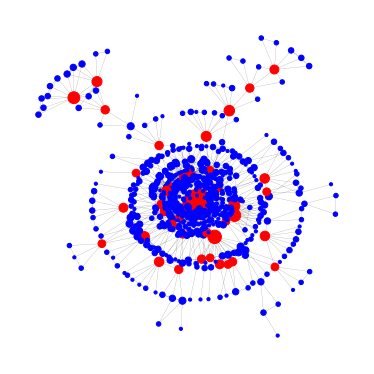

In [9]:
node_sizes = dict(G.degree())
node_colors = ['r' if entry>5 else 'b' for entry in node_sizes.values()]
plt.figure(3,figsize=(5,5)) 
nx.draw_kamada_kawai(G, node_size=[10 * s for s in node_sizes.values()], font_size=6, with_labels = False, node_color=node_colors, width = 0.1)
print(G.number_of_nodes())
plt.show()

In [10]:
plt.figure(3,figsize=(100,100)) 
nx.draw_kamada_kawai(G, node_size=[30 * s for s in node_sizes.values()], font_size=12, with_labels = False, node_color=node_colors, width = 1)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

In [23]:
from networkx.algorithms import community
communities = community.girvan_newman(G)
node_groups = []
for com in next(communities):
    node_groups.append(list(com))
#print(node_groups)
#print(len(node_groups))
color_map = []
for node in G:
    if node in node_groups[0]:
        color_map.append('blue')
    elif node in node_groups[1]:
        color_map.append('green')
    elif node in node_groups[2]:
        color_map.append('yellow')
    elif node in node_groups[3]:
        color_map.append('red')
    else:
        color_map.append('black')

<function matplotlib.pyplot.show(close=None, block=None)>

<function matplotlib.pyplot.show(close=None, block=None)>

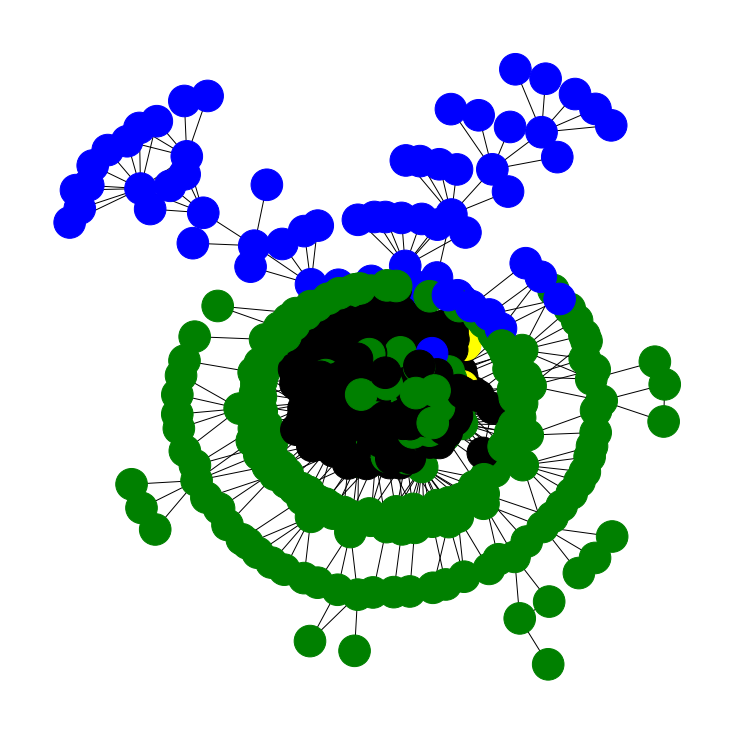

In [28]:
plt.figure(3,figsize=(10,10)) 
nx.draw_kamada_kawai(G, node_size=1000, font_size=12, with_labels = False, node_color=color_map, width = 1)
plt.show

## Experiments with Wordclouds

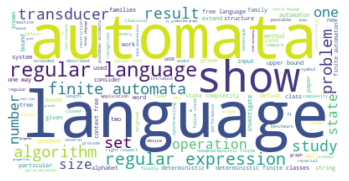

In [33]:
from wordcloud import WordCloud, STOPWORDS
abstracts = data[' Abstract'].tolist()
text = ''
for i in range(len(abstracts)):
    text += (' '+str(abstracts[i]))
text = text.lower()
wordcloud = WordCloud(background_color='white').generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

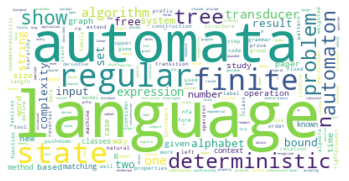

In [34]:
with open('stopwords.txt') as f: #Source: https://gist.github.com/sebleier/554280
    stopwords = f.read()
stopwords = stopwords.split(', ')
STOPWORDS.update(stopwords)
wordcloud = WordCloud(background_color='white', collocations=False).generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

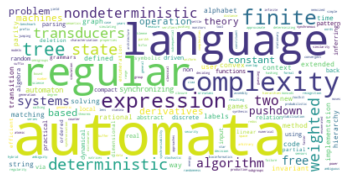

In [38]:
titles = data["Title"].tolist()
title_string = ''
for title in titles:
    title_string += (' '+str(title))
title_string = title_string.lower()
titlecloud = WordCloud(background_color='white', collocations=False).generate(title_string)
plt.imshow(titlecloud, interpolation='bilinear')
plt.axis('off')
plt.show()

2.8969072164948453


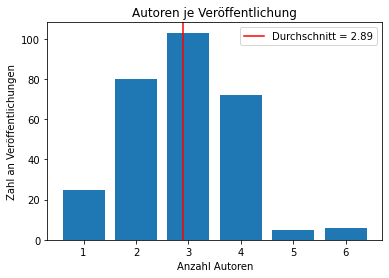

In [72]:
from collections import Counter

publications = Counter(authors)

members = []
for i in range(len(co_authors)):
    if co_authors[i] != ['']:
        members.append(len(co_authors[i])+1)
    else:
        members.append(1)
collaboration = Counter(members)
collaboration = sorted(collaboration.items())
avg = (sum(members)/len(members))
print(avg)
x, y = zip(*collaboration)
plt.bar(x, y)
plt.title('Autoren je Veröffentlichung')
plt.ylabel('Zahl an Veröffentlichungen')
plt.xlabel('Anzahl Autoren')
plt.axvline(avg, color = 'red', label = 'Durchschnitt = 2.89')
plt.legend()
plt.show()